<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Комментарий ревьюера</b>


Привет! Давай знакомиться! Меня зовут Дмитрий Махортов, и я буду проверять твой проект. Сразу предлагаю общение на «ты» 🙂, но если тебе это не комфортно, то дай знать, и мы перейдем на «вы». 


Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе погрузиться в увлекательный мир работы с данными и вырасти в крепкого профи. Это отдаленная цель. А ближайшая - сделать твою работу еще лучше )).
   
    
Все ключевые этапы в работе выполнены, и я вижу что с проектом ты справшяешься. Есть моменты, которые нужно доработать, но я уверен, у тебя все получится.
        
Расскажу как обычно проходит проверка:    
Бывают моменты, которые требуют пристального внимания. Комментарии по ним выделены <span style='background-color:#F7B3A4'> красным цветом </span> и обозначены значком 🛑. После их доработки проект будет принят.  🙂
 
<span style='background-color:#B7EBA7'> Зеленым цветом </span> и значком ✅ отмечены удачные и элегантные решения, на которые можно опираться в будущих проектах. Или советы «со звездочкой», которые помогут тебе в будущем.

<span style='background-color:#F9EDA6'>Жёлтым цветом </span> и значком ⚠️ выделено то, что в следующий раз можно сделать по-другому. Ты можешь учесть эти комментарии при выполнении будущих заданий или доработать проект сейчас (однако это не обязательно).

Давай работать над проектом в диалоге: **если ты что-то меняешь в проекте по моим рекомендациям — пиши об этом**. Выбери для своих комментариев какой-то заметный цвет, так мне будет легче отследить изменения. Пожалуйста, **не перемещай, не изменяй и не удаляй мои комментарии**. Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Можешь использовать этот комментарий. Просто удали этот текст и вместо него напиши свой 🙂

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Привет! Спасибо большое за твои комментарии! Они помогли лучше понять детали и на что обращать внимание 🙂

</div>

# Сборный проект-5

Необходимо разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

**Описание данных**

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).
Данные представлены в следующих файлах: для обучения модели `train_dataset.csv` и `train_images`, по соответствию изображения и описания `CrowdAnnotations.tsv` и `ExpertAnnotations.tsv`, для тестирования модели `test_queries.csv` и `test_images`.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

**Составим краткий план исследования:**
1. Загрузка данных
2. Исследовательский анализ данных
3. Подготовка данных к обучению модели
    - очистка датасета
    - векторизация текстового описания
    - векторизация изображений
4. Обучение модели
    - выбор метрики
    - подбор гиперпараметров
5. Тестирование модели и демонстрация её работы
6. Общий вывод

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Да, это хорошая практика - дать описание контекста и проблемы, которую мы решаем. </div>

In [1]:
# !pip install torchvision -q

In [2]:
# импорт необходимых библиотек
import pandas as pd
import numpy as np
import re
import os

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from PIL import Image

import spacy
import nltk
from nltk.corpus import stopwords as nltk_stopwords

import torch
import torch.nn as nn
import transformers
import torchvision.models as models
from torchvision import transforms
from tqdm import tqdm

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor
from sklearn.tree import DecisionTreeRegressor
from lightgbm import LGBMRegressor

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, все нужные библиотеки импортированы в начале ноутбука.Это хорошая практика.</div>

In [3]:
# производительность
gpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu");

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


### 1.1 Загрузка данных

In [4]:
# чтение файлов с данными
try:
    path = './to_upload/'
    train_df = pd.read_csv(path + 'train_dataset.csv', sep=',')
    crowd = pd.read_csv(path + 'CrowdAnnotations.tsv', sep='\t',
                        names=['image', 'query_id', 'proportion_pos', 'count_pos', 'count_neg'])
    expert = pd.read_csv(path + 'ExpertAnnotations.tsv', sep='\t',
                         names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])
    test_queries = pd.read_csv(path + 'test_queries.csv', sep='|', index_col='Unnamed: 0')
    test_images = pd.read_csv(path + 'test_images.csv', sep='|')
except:
    path = '../to_upload/'
    train_df = pd.read_csv(path + 'train_dataset.csv', sep=',')
    crowd = pd.read_csv(path + 'CrowdAnnotations.tsv', sep='\t',
                        names=['image', 'query_id', 'proportion_pos', 'count_pos', 'count_neg'])
    expert = pd.read_csv(path + 'ExpertAnnotations.tsv', sep='\t',
                         names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])
    test_queries = pd.read_csv(path + 'test_queries.csv', sep='|', index_col='Unnamed: 0')
    test_images = pd.read_csv(path + 'test_images.csv', sep='|')

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Молодец, что как "прилежная ученица" повторила конструкцию try/except которую мы использовали на протяжении всего обучения. Но в данном проекте мы не знаем, где будет запускать проект наш коллега/заказчик. Поэтому вполне достаточно просто задать константу с путем к данным в самом начале.

Но меня очень порадовало, что ты учла, что папка с данными скорее всео будет называться to_upload и предожила два наиболее вероятных пути - текущая папка и на уровень выше. 

</div>

In [5]:
def funk_info(df):
    '''Функция для вывода первичной информации'''
    display(df.head())
    df.info()
    print('Наименования столбцов:', df.columns)
    print(f'Количество пропусков:\n{df.isna().sum()}')
    print('Количество явных дубликатов:', df.duplicated().sum())

**Данных для обучения**

В файле `train_dataset.csv` находится информация, необходимая для обучения: 
- image - имя файла изображения, 
- query_id - идентификатор описания,
- query_text - текст описания. 

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`. В папке `train_images` содержатся изображения для тренировки модели.

In [6]:
# вывод информации о данных для обучения
funk_info(train_df)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
Наименования столбцов: Index(['image', 'query_id', 'query_text'], dtype='object')
Количество пропусков:
image         0
query_id      0
query_text    0
dtype: int64
Количество явных дубликатов: 0


**Данных по соответствию изображения и описания, полученные с помощью краудсорсинга**

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
- image - имя файла изображения;
- query_id - идентификатор описания;
- proportion_pos - доля людей, подтвердивших, что описание соответствует изображению;
- count_pos - количество человек, подтвердивших, что описание соответствует изображению;
- count_neg - количество человек, подтвердивших, что описание не соответствует изображению.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

In [7]:
# вывод информации о данных по соответствию изображений описаниям
funk_info(crowd)

,image,query_id,proportion_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           47830 non-null  object 
 1   query_id        47830 non-null  object 
 2   proportion_pos  47830 non-null  float64
 3   count_pos       47830 non-null  int64  
 4   count_neg       47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
Наименования столбцов: Index(['image', 'query_id', 'proportion_pos', 'count_pos', 'count_neg'], dtype='object')
Количество пропусков:
image             0
query_id          0
proportion_pos    0
count_pos         0
count_neg         0
dtype: int64
Количество явных дубликатов: 0


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

**Данных по соответствию изображения и описания, полученные в результате опроса экспертов**

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
- image - имя файла изображения;
- query_id - идентификатор описания;
- expert_1 - оценка первого эксперта;
- expert_2 - оценка второго эксперта;
- expert_3 - оценка третьего эксперта.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

In [8]:
# вывод информации о данных по соответствию изображений описаниям, полученных от экспертов
funk_info(expert) 

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
Наименования столбцов: Index(['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'], dtype='object')
Количество пропусков:
image       0
query_id    0
expert_1    0
expert_2    0
expert_3    0
dtype: int64
Количество явных дубликатов: 0


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

**Данных для тестирования**

В файле `test_queries.csv` находится информация, необходимая для тестирования: 
- query_id - идентификатор запроса,
- query_text - текст запроса,
- image - релевантное изображение. 

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`. В папке `test_images` содержатся изображения для тестирования модели.

In [9]:
# вывод информации данных для тестирования
funk_info(test_queries) 

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
Наименования столбцов: Index(['query_id', 'query_text', 'image'], dtype='object')
Количество пропусков:
query_id      0
query_text    0
image         0
dtype: int64
Количество явных дубликатов: 0


In [10]:
# вывод информации по изображениям для тестирования
funk_info(test_images) 

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes
Наименования столбцов: Index(['image'], dtype='object')
Количество пропусков:
image    0
dtype: int64
Количество явных дубликатов: 0


**Выводы:** Данные всех представленных данных загружены и прочитаны. Пропуски и явные дубликаты в данных отсутствуют.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, данные загружены, есть первичный осмотр. Молодец, что сразу позаботилась о корректных названиях в колонках. </div>

### 1.2 Исследовательский анализ данных

In [11]:
def clear_text(text):
    '''Функция очистки текста'''
    text_r = text.lower().split()
    text_r = ' '.join(text_r)
    text_r = re.sub(r'[^a-z ]', '', text_r)
    return text_r

def word_cloud(df):
    '''Функция построения облака слов'''
    plt.figure(figsize=(16,16))
    text = ' '.join(df.values)
    WC = WordCloud(width=1000, height=500, max_words=500, min_font_size=5, collocations=False)
    cloud_1 = WC.generate(text)
    plt.imshow(cloud_1, interpolation='bilinear')
    plt.title(f'Облако слов', fontsize=20)
    plt.show

def image_show(path_df, df):
    '''Функция вывода фотографий'''
    fig = plt.figure(figsize=(10,10))
    for i in range(12):
        fig.add_subplot(4, 4, i+1)
        image = Image.open(path+path_df+df['image'][i])
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
    del image

#### Исследовательский анализ данных для обучения модели

Исследуем файлы для обучения модели. Так как данные представлены набором "текст-картинка", то построим облако слов, чтобы понять какие слова упоминаются наиболее часто. А также выведем несколько картинок.

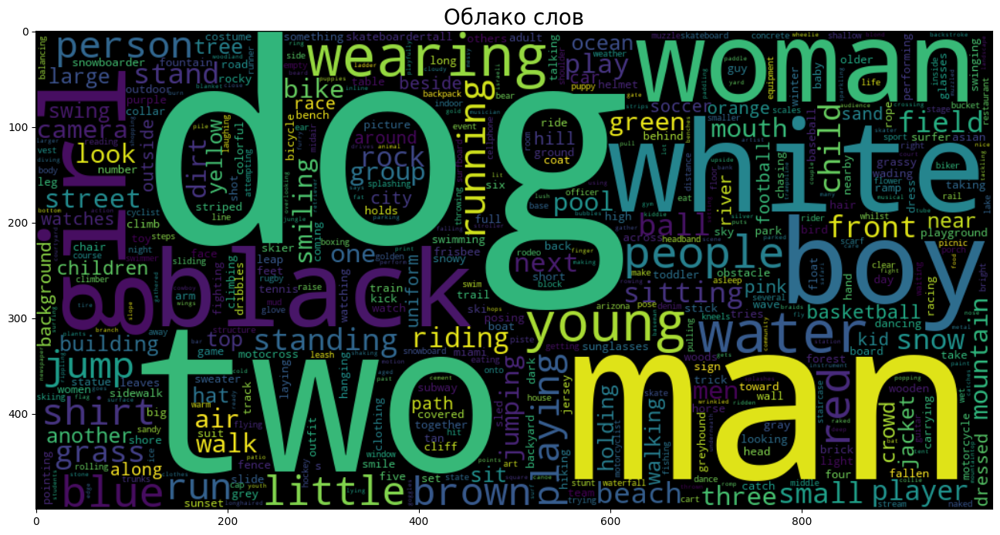

In [12]:
# очистим текст описаний
train_df['clean_query_text'] = [clear_text(x) for x in train_df['query_text']]
# построим облако слов
word_cloud(train_df['clean_query_text'])

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Давай запомним, что наиболее часто в датасете встречаюся сущности "собака" и "человек".  Именно поэтому, если модель научится хотя-бы отличать людей от собак мы сможем говорить об "зачатках разума" )) </div>

In [13]:
print('Количество уникальных изображений в данных для обучения:', len(train_df['image'].unique()))
print('Количество уникальных описаний в данных для обучения:', len(train_df['clean_query_text'].unique()))

Количество уникальных изображений в данных для обучения: 1000
Количество уникальных описаний в данных для обучения: 977


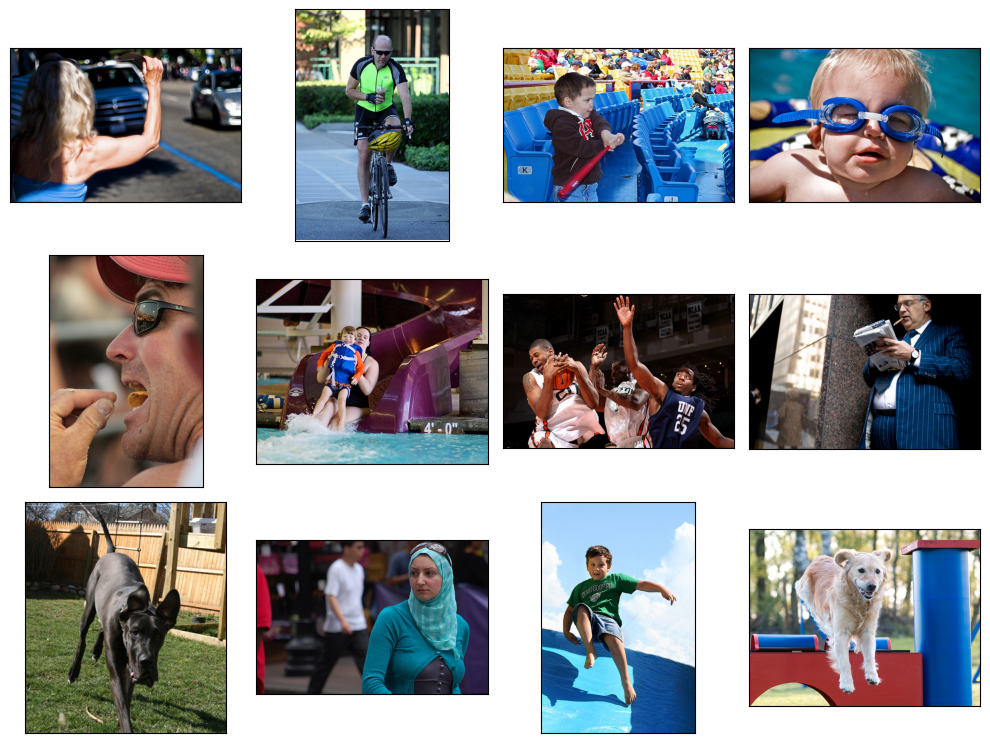

In [14]:
# выведем несколько фотографий
image_show('/train_images/', train_df)

**Вывод:** Наиболее часто встречаются слова *dog*, *two* и *man*. В данных имеется с 977 уникальных описаний и 1000 изображений. Следует отметить, что в описаниях встречаются слова *boy*, *girl* и *young*, а в фотографиях встречаются фото детей, что может накладывать законодательные ограничения в использовании таких данных в ряде стран.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

#### Исследовательский анализ данных для тестирования модели

Исследуем файлы для тестирования модели. Так как данные представлены набором "текст-картинка", то построим облако слов, чтобы понять какие слова упоминаются наиболее часто. А также выведем несколько картинок.

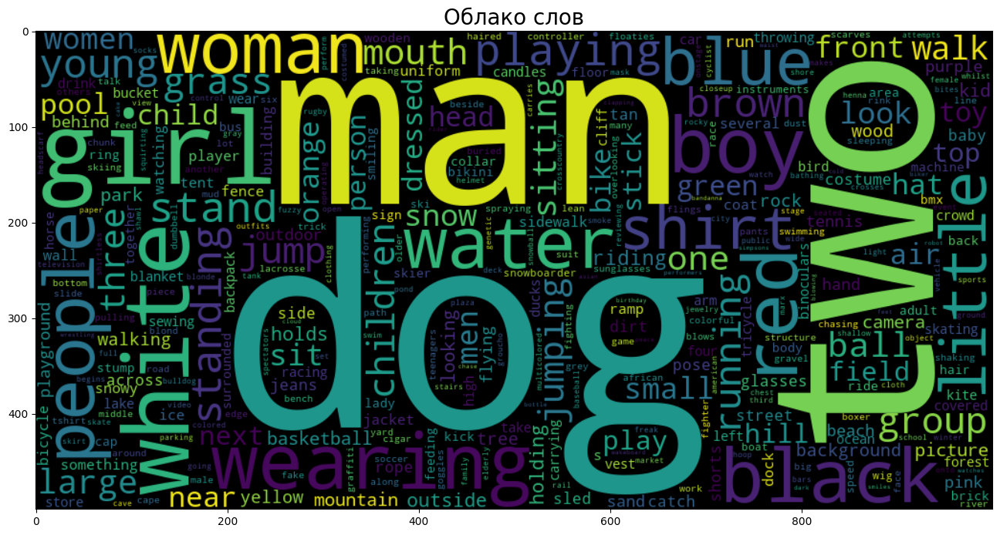

In [15]:
# очистим текст описаний
test_queries['clean_query_text'] = [clear_text(x) for x in test_queries['query_text']]
# построим облако слов
word_cloud(test_queries['clean_query_text'])

In [16]:
print('Количество уникальных изображений в данных для обучения:', len(test_images['image'].unique()))
print('Количество уникальных описаний в данных для обучения:', len(test_queries['clean_query_text'].unique()))

Количество уникальных изображений в данных для обучения: 100
Количество уникальных описаний в данных для обучения: 500


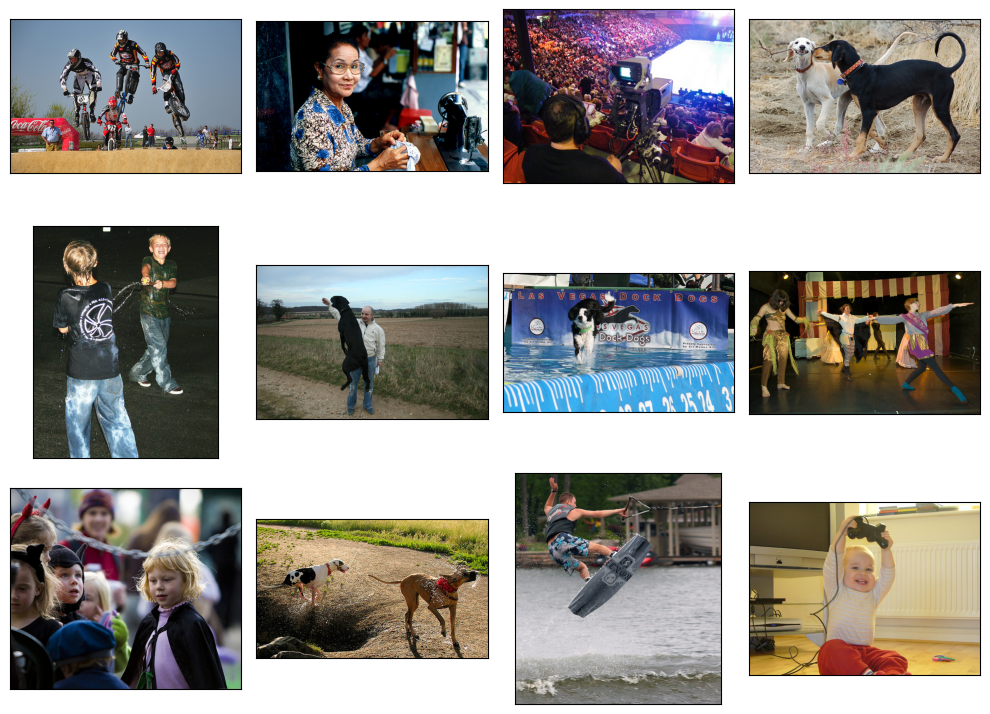

In [17]:
# выведем несколько фотографий
image_show('/test_images/', test_images)

**Вывод:** Наиболее часто встречаются слова *dog*, *man* и *two*. В данных имеется с 500 уникальных описаний и 100 изображений. Следует отметить, что в описаниях встречаются слова *boy*, *girl* и *young*, а в фотографиях встречаются фото детей, что может накладывать законодательные ограничения в использовании таких данных в ряде стран.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

#### Исследовательский анализ данных соответствия изображений описаниям по краудсорсинговым оценкам 

В файле с краудсорсинговыми оценками информация расположена в следующем порядке:
1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

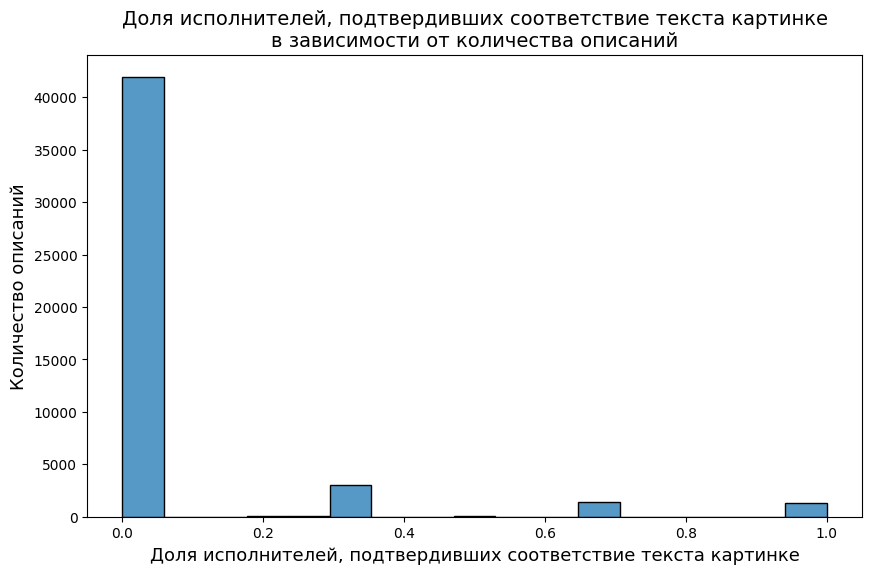

In [18]:
# график зависимости доли исполнителей, подтвердивших соответствие текста картинке, от количества данных
plt.subplots(figsize=(10, 6))
sns.histplot(crowd['proportion_pos'])
plt.title(f'Доля исполнителей, подтвердивших соответствие текста картинке\nв зависимости от количества описаний', fontsize=14)
plt.xlabel('Доля исполнителей, подтвердивших соответствие текста картинке', fontsize=13)
plt.ylabel('Количество описаний', fontsize=13)
plt.show()

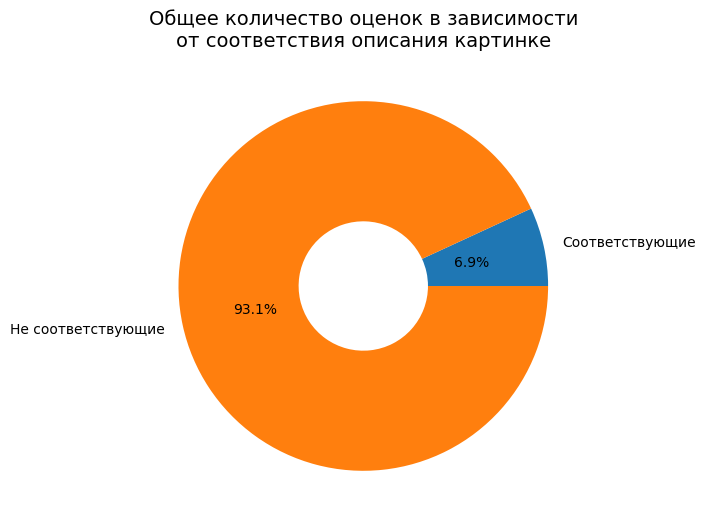

In [19]:
crowd_df = np.array([['Соответствующие', crowd['count_pos'].sum()],
                ['Не соответствующие', crowd['count_neg'].sum()]])
crowd_df = pd.DataFrame(crowd_df, columns=['Описания', 'Количество оценок'])
# график количества оценок
plt.subplots(figsize=(10, 6))
plt.pie(crowd_df['Количество оценок'], labels=list(crowd_df['Описания'].unique()),
                wedgeprops=dict(width=0.65), autopct='%1.1f%%')
plt.title(f'Общее количество оценок в зависимости\nот соответствия описания картинке', fontsize=14)
plt.show()

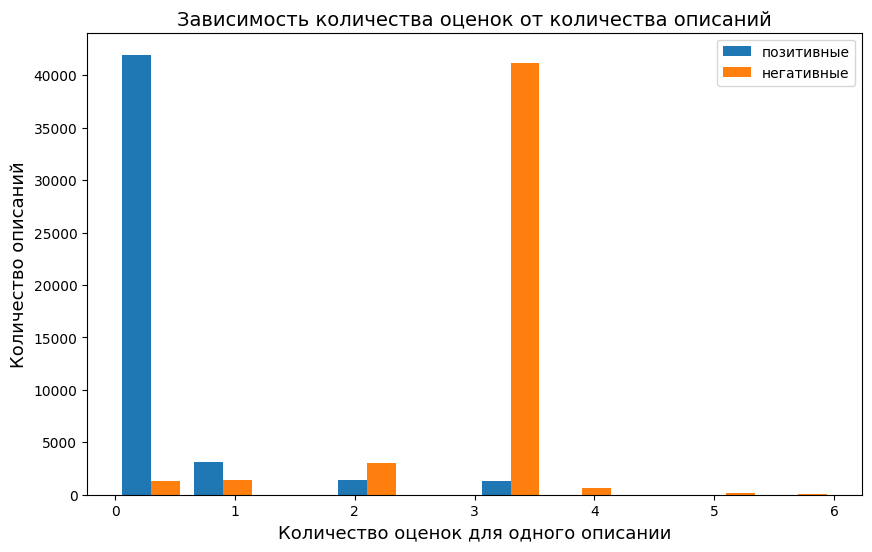

In [20]:
# график зависимости доли исполнителей, подтвердивших соответствие текста картинке, от количества данных
plt.subplots(figsize=(10, 6))
plt.hist([crowd['count_pos'], crowd['count_neg']])
plt.title(f'Зависимость количества оценок от количества описаний', fontsize=14)
plt.xlabel('Количество оценок для одного описании', fontsize=13)
plt.ylabel('Количество описаний', fontsize=13)
plt.legend(['позитивные', 'негативные'])
plt.show()

In [21]:
print('Количество уникальных изображений в данных c краудсорсинговым оценкам:', len(crowd['image'].unique()))
print('Количество уникальных описаний в данных c краудсорсинговым оценкам:', len(crowd['query_id'].unique()))

Количество уникальных изображений в данных c краудсорсинговым оценкам: 1000
Количество уникальных описаний в данных c краудсорсинговым оценкам: 1000


In [22]:
crowd.describe().T

,count,mean,std,min,25%,50%,75%,max
proportion_pos,47830.0,0.068786,0.207532,0.0,0.0,0.0,0.0,1.0
count_pos,47830.0,0.208488,0.628898,0.0,0.0,0.0,0.0,5.0
count_neg,47830.0,2.820155,0.656676,0.0,3.0,3.0,3.0,6.0


**Вывод:** Количество уникальных изображений и описаний, которые были оценены с помощью краудсорсинга, составляют по 1000 экземпляров. Из графиков можно увидеть, что количество негативных оценок, когда исполнители, подтвердили, что текст не соответствует картинке, значительно больше положительных оценок - 93% против 7%. Больше всего описаний не получают ни одной положительной оценки, а негативных - от трех исполнителей.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

#### Исследовательский анализ данных соответствия изображений описаниям по экспертным оценкам 

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Эксперты ставят оценки по шкале от 1 до 4, где:
* 1 — изображение и запрос совершенно не соответствуют друг другу, 
* 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 
* 3 — запрос и текст соответствуют с точностью до некоторых деталей, 
* 4 — запрос и текст соответствуют полностью.

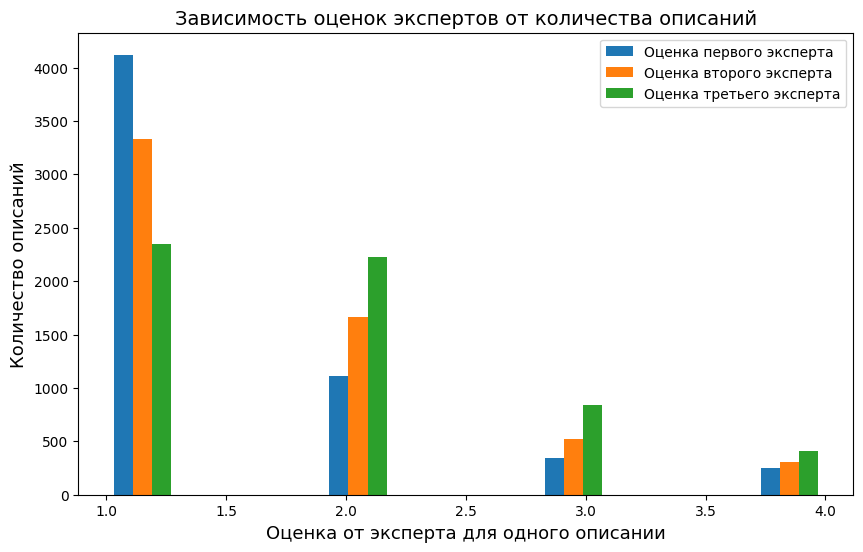

In [23]:
# график зависимости доли исполнителей, подтвердивших соответствие текста картинке, от количества данных
plt.subplots(figsize=(10, 6))
plt.hist([expert['expert_1'], expert['expert_2'], expert['expert_3']])
plt.title(f'Зависимость оценок экспертов от количества описаний', fontsize=14)
plt.xlabel('Оценка от эксперта для одного описании', fontsize=13)
plt.ylabel('Количество описаний', fontsize=13)
plt.legend(['Оценка первого эксперта', 'Оценка второго эксперта', 'Оценка третьего эксперта'])
plt.show()

In [24]:
print('Количество уникальных изображений в данных c экспертными оценкам:', len(expert['image'].unique()))
print('Количество уникальных описаний в данных c экспертными оценкам:', len(expert['query_id'].unique()))

Количество уникальных изображений в данных c экспертными оценкам: 1000
Количество уникальных описаний в данных c экспертными оценкам: 977


In [25]:
expert.describe().T

,count,mean,std,min,25%,50%,75%,max
expert_1,5822.0,1.436620,0.787084,1.0,1.0,1.0,2.0,4.0
expert_2,5822.0,1.624356,0.856222,1.0,1.0,1.0,2.0,4.0
expert_3,5822.0,1.881999,0.904087,1.0,1.0,2.0,2.0,4.0


**Вывод:** Количество уникальных изображений и описаний, которые были оценены экспертами, составляют 1000 экземпляров изображений и 977 текстов. Из графиков можно увидеть, что количество негативных оценок, когда эксперты, подтвердили, что текст совершенно не соответствует картинке, значительно больше чем когда текст и изображение немного соответствуют.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Да, вполне содержательный интересный и понятный анализ. </div>

### 1.3 Агрегация краудсорсинговых и экспертных оценок 

Краудсорсинговые и экспертные оценки необходимо превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

In [26]:
def expert_agr(row):
    'Функция агрегации экспертных оценок'
    if row['expert_1'] != row['expert_2'] != row['expert_3']:
        row['expert_un'] = None
    else:
        row['expert_un'] = max([row['expert_1'], row['expert_2'], row['expert_3']], key=[row['expert_1'], row['expert_2'], row['expert_3']].count)
    return row

def agr(row):
    'Функция агрегации оценок'
    if pd.isna(row['proportion_pos']):
        row['agr'] = row['expert_norm']
    elif pd.isna(row['expert_norm']):
        row['agr'] = row['proportion_pos']
    else:
        row['agr'] = 0.8 * row['expert_norm'] + 0.2 * row['proportion_pos']
    return row

In [27]:
# агрегация экспертных оценок
expert = expert.apply(expert_agr, axis=1)
display(expert.head())
print('Процент несовпадающих оценок у экспертов:', round(float(expert['expert_un'].isna().sum() / expert.shape[0] * 100), 2), '%')

,image,query_id,expert_1,expert_2,expert_3,expert_un
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.0


Процент несовпадающих оценок у экспертов: 2.16 %


In [28]:
# нормализация экспертных оценок
min_un = expert['expert_un'].min()
max_un = expert['expert_un'].max()
expert['expert_norm'] = (expert['expert_un'] - min_un) / (max_un - min_un) 
expert.value_counts('expert_norm')

expert_norm
0.000000    3327
0.333333    1566
0.666667     492
1.000000     311
Name: count, dtype: int64

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
ОК, экспертные оценки привели к диапазону 0-1 </div>

In [29]:
# объединение экспертных и краудсорсинговых оценок
# выберем объединение left, так как он совпадает по размеру с данными для обучения
df_ass = expert.merge(crowd, on=['image', 'query_id'], how='left')
df_ass = df_ass.drop(['expert_1', 'expert_2', 'expert_3', 'expert_un', 'count_pos', 'count_neg'], axis=1)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">

По объединению экспертных и крауд оценок все ОК, но подсвечу возможные альтернативы
    
--------------    
    
    
В этом проекте есть несколько возможных стратегий работы с обучающими и краудсорс оценками,  вот эти стратегии с плюсами и минусами:
   

   - использовать соединение через outer, в этом случае, при корректной обработке пропусков мы можем получить более 50К размеченых пар. К плюсам данного подхода можно отнести большое количество данных. Минус - в основном это будут данные, размеченные краудсорсерами, а там качество раметки ниже.
   - использовать только экспертные оценки. плюс - высокое качество данных (разметка имеет шкалу). Минус - данных меньше.  Поясню по поводу качества разметки на примере: если на изображении одна собака, а в описании "две собаки бегут по берегу", то эксперты поставять соответствие 0,6-0,7 (переводя в шкалу 0-1), а краудсорсеры поставят 0.  Но на экспертных оценках модель хотя-бы научится находить собак, а на краудсор оценках ничему не начится.

   - использование соединения через left.  Данный подход очевидно проигрывает второму варианту: данных столько же, нужно дополнительно возиться с объединением, но качество разметки снижается.. Но это соответсвует предложениям авторов проекта, поэтому такой подход имеет право на жизнь

   - объединение через inner. Тут все плохо - и данных ОЧЕНЬ мало (в два раза меньше, чем использовать только экспертные оценки) и качество у них "подпорчено". И навыков по обработке пропусков не получаем.....


</div>

In [30]:
# агрегация оценок
df_ass = df_ass.apply(agr, axis=1)
display(df_ass.head())
print('Процент пропусков:\n', round(df_ass.isna().sum() / df_ass.shape[0] * 100), 2)

,image,query_id,expert_norm,proportion_pos,agr
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,0.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,0.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000,NaN,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333,NaN,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000,NaN,0.000000


Процент пропусков:
 image              0.0
query_id           0.0
expert_norm        2.0
proportion_pos    60.0
agr                1.0
dtype: float64 2


In [31]:
# оставим только столбец с агрегированными оценками
df_ass = df_ass.drop(['expert_norm', 'proportion_pos'], axis=1)
# удалим отсутвующие значения
df_ass = df_ass.dropna()
df_ass.shape

(5767, 3)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 ОК, получен датафрейм с единой оценкой</div>

**Вывод:** На основе краудсорсинговых и экспертных оценок была получена агрегированая оценка соответствия изображения тексту. Для этого экспертные оценки на основе "голосование большинства" были объединены в одну оценку и далее нормализованны.
Далее был объединены датасеты с краудсорсинговой и экспертной оценками, которые были объединены в одну с коэффициентами 0.4 и 0.6 соответственно. Если какая из оценок отсутствовала, то принималась в качестве итоговой та, которая не отсутсвовала. Данные в которых обе оценки, и краудсорсинговая и экспертная, отсутсвовали, были удалены.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [32]:
# объединим данные для обучения и агрегированную оценку
train_df = train_df.merge(df_ass, on=['image', 'query_id'], how='right')
train_df.head()

,image,query_id,query_text,clean_query_text,agr
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child is wearing blue goggles and sitt...,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,a girl wearing a yellow shirt and sunglasses s...,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,a man sleeps under a blanket on a city street,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,a woman plays with long red ribbons in an empt...,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,chinese market street in the winter time,0.000000


In [33]:
# проверка датафрейма после объединения
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5767 entries, 0 to 5766
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   image             5767 non-null   object 
 1   query_id          5767 non-null   object 
 2   query_text        5767 non-null   object 
 3   clean_query_text  5767 non-null   object 
 4   agr               5767 non-null   float64
dtypes: float64(1), object(4)
memory usage: 225.4+ KB


Датафрейм объединен, пропуски отсутсуют.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 ОК, получен датафрейм признаки/таргет, с которым мы уже можем продолжать все преобразования.</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Но я бы дополнительно вывел по нему info(), что бы проверить сколько в нем записей и нет ли пропусков.

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Добавила info() и анализ объединения

</div>

In [34]:
# Загрузка языковой модели
nlp = spacy.load('en_core_web_sm')

def lemmatize(text):
    '''Функция лемматизации'''
    lem_doc = nlp(text)
    lem_text = [token.lemma_ for token in lem_doc]
    return ' '.join(lem_text)

In [35]:
# загрузка WordNet для лемматизации
nltk.download('wordnet')
# загрузка и сохранение стоп-слов
stopwords = list(set(nltk_stopwords.words('english')))

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ambrosovskaya_T\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [36]:
# лемматизация
if os.path.exists('lemmatize.csv'):
    # чтение из файла
    df_l = pd.read_csv('./lemmatize.csv', sep=',', index_col='Unnamed: 0')    
    train_df['lemm_text'] = [str(i) for i in df_l['lemm']]
else:
    train_df['lemm_text'] = train_df['clean_query_text'].apply(lemmatize)
    # запись в файл
    data_lemm = pd.DataFrame()
    data_lemm['lemm'] = train_df['lemm_text']
    data_lemm.to_csv('lemmatize.csv', index=True)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Идея с лемматизацией хороша. Но она очень "дорогая" - хорошая лемматизация занимает время. Кроме того ведь её нужно написать, проверить на ошибки, возможно "утащить в прод"..
    
А между тем лемматизация  нужна нам в двух случаях:  

 - При чистке датасета от детских изображений. 
 - При векторизации.
    
При поиске детских изображений я  считаю возможным упростить себе жизнь - взять возможные словоформы "запрещенных" слов. Как правиль их всего две - единственное и множественное число. 
    
А для вкторизациии делать лемматизацию в нашем случае не нужно. Модель BERT обучалась на обычных, сырых,не лемматизированных текстах.    

    
</div>

In [37]:
# проверка, что лемматизированный текст добавлен в датафрейм
train_df.head()

,image,query_id,query_text,clean_query_text,agr,lemm_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,a young child is wearing blue goggles and sitt...,0.000000,a young child be wear blue goggle and sit in a...
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,a girl wearing a yellow shirt and sunglasses s...,0.000000,a girl wear a yellow shirt and sunglasse smile
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,a man sleeps under a blanket on a city street,0.000000,a man sleep under a blanket on a city street
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,a woman plays with long red ribbons in an empt...,0.333333,a woman play with long red ribbon in an empty ...
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,chinese market street in the winter time,0.000000,chinese market street in the winter time


In [38]:
# создадим список слов, которые могут попадать по запрет изображений и текстов
BLOCK_WORDS = ['child', 'children', 'kid', 'kids', 'toddler', 'infant',
               'baby', 'girl', 'girls', 'boy', 'boys', 'teenager', 'teenagers',
               'teen', 'youth', 'youngster', 'underage', 'schoolchild']

In [39]:
def block(text):
    '''Функция разметки текста'''
    text_list = text.split()
    intersection = set(text_list).intersection(BLOCK_WORDS)
    if intersection:
        return 1
    else:
        return 0

In [40]:
# оставим только необходимые столбцы
train_df = train_df.drop(['query_text', 'clean_query_text'], axis=1)
# маркируем тексты
train_df['block_text'] = [block(x) for x in train_df['lemm_text']]
train_df.head()

,image,query_id,agr,lemm_text,block_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000,a young child be wear blue goggle and sit in a...,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,a girl wear a yellow shirt and sunglasse smile,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000,a man sleep under a blanket on a city street,0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333,a woman play with long red ribbon in an empty ...,0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000,chinese market street in the winter time,0


In [41]:
# считаем уникальные заблокированные тексты
block_texts = train_df.drop_duplicates(subset=['lemm_text'])
# выводим количество уникальных изображений
print('Всего уникальных изображений попадающих под ограничения:', block_texts['block_text'].sum())

Всего уникальных изображений попадающих под ограничения: 292


In [42]:
# выводим несколько заблокированных текстов
print(block_texts[block_texts['block_text'] == 1]['lemm_text'].sample(10).unique())

['kid guard face from soccer ball'
 'a little boy in navy blue be run very fast'
 'a young girl wear blue smile'
 'a girl in a winter coat with a birthday cake'
 'two girl dress up for halloween' 'a young boy be ride a bike'
 'a boy smile at point at something   a man look to the side'
 'six african child sit at two table'
 'a young girl in a white dress watch bubble while a woman and girl toddler observe'
 'a young girl with makeup and jewelry smile']


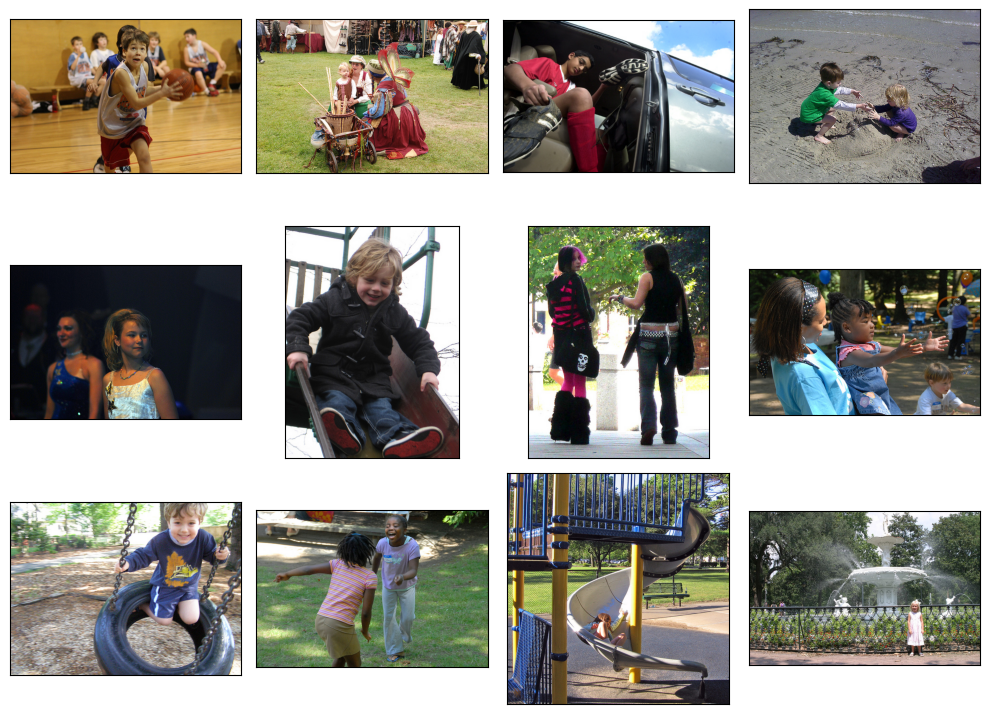

In [43]:
# список изображений попадающих под блок
bl_images = [i[:-2] for i in list(block_texts.query('block_text == 1')['query_id'].unique())] 
# считаем их количество
block_texts = block_texts.query('image in @bl_images').sample(16).reset_index(drop=True)
image_show('/train_images/', block_texts)

In [44]:
# список изображений попадающих под блок
block_images = [i[:-2] for i in list(set(train_df.query('block_text == 1')['query_id']))] 
# считаем их количество
print('Количество изображений попадающих в блок:', len(train_df.query('image in @block_images')))
# удаление изображений попадающих под блок
train_df = train_df.drop(train_df.query('image in @block_images').index)
train_df = train_df.drop('block_text', axis=1).reset_index(drop=True)
train_df.shape


Количество изображений попадающих в блок: 1727


(4040, 4)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Из датасета исключены записи, содержащие изображения с детьми. </div>

**Вывод:** Тексты и фотографии, которые необходимо исключить к целом отобраны корректно и удалены из данных для обучения.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [45]:
def create_image():
    '''Функция обработки изображения'''
    norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    preprocessor = transforms.Compose([transforms.Resize(256),
                                       transforms.CenterCrop(224),
                                       transforms.ToTensor(),
                                       norm])
    return preprocessor

In [46]:
def create_model():
    '''Функция создания модели'''
    resnet = models.resnet50(pretrained=True)
    modules = list(resnet.children())[:-1]
    model = nn.Sequential(*modules)
    model.eval() 
    return model

In [47]:
def vectorize_pictures(model, preprocessor, path, path_df, df):
    '''Функция загрузки изображений и обучения модели'''
    image_embeddings = []
    for i in tqdm(range(len(list(df['image'])))):
        image = Image.open(path + path_df + df['image'][i]).convert('RGB')
        image_tensor = preprocessor(image)
        output_tensor = model(image_tensor.unsqueeze(0)).flatten()
        image_embeddings.append(output_tensor.detach().numpy())
    return np.asarray(image_embeddings)

In [48]:
# векторизация изображений
features_image = vectorize_pictures(create_model(), create_image(), path, 'train_images/', train_df)
# размер признаков
print('Размерность признаков изображений:', features_image.shape)

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 4040/4040 [06:29<00:00, 10.37it/s]

Размерность признаков изображений: (4040, 2048)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Отлично, вектра для изображений получены👍 </div>

**Вывод:** выполнили векторизацию изображений.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [49]:
# создаём объекты классов DistilBERT + DistilBERTTokenizer
model_class, tokenizer_class = transformers.AutoModel, transformers.AutoTokenizer
# загружаем веса
tokenizer = tokenizer_class.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')
model = model_class.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')

In [50]:
def vectorize_text_train(model, text, tokenizer=tokenizer, batch_size=4): 
    '''Функция векторизации текста'''
    # токенизация
    tokenized = text.apply((lambda x: tokenizer.encode(x, add_special_tokens=True, truncation=True, max_length=128)))
    # находим максимальную длину векторов после токенизации
    max_len = max([len(i) for i in tokenized.values])
    # применим padding к векторам
    padded = np.array([i + [0] * (max_len - len(i)) for i in tokenized.values])
    # создадим маску для важных токенов
    attention_mask = np.where(padded != 0, 1, 0)
    # векторизируем текст
    embeddings = []
    for i in tqdm(range(padded.shape[0] // batch_size)):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])
        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)
            hidden_states = batch_embeddings[0]
        mask = attention_mask_batch.unsqueeze(-1)
        masked_hidden = hidden_states * mask
        sum_hidden = masked_hidden.sum(dim=1)
        lengths = mask.sum(dim=1)
        pooled_embeddings = sum_hidden / lengths.clamp(min=1e-9)
        embeddings.append(pooled_embeddings.numpy())
    return np.concatenate(embeddings)

In [51]:
# векторизация текстов
features_text = vectorize_text_train(model, train_df['lemm_text'])
# итоговый размер признаков
print('Размерность текстовых признаков:', features_text.shape)

100%|██████████| 1010/1010 [00:23<00:00, 43.61it/s]

Размерность текстовых признаков: (4040, 384)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично,полученные векторные представления для текстов описаний с помощью BERT </div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Подсвечу желтым, чтобы не потерялось.
    
По моим наблюдениям, в этом проекте неплохо показыает себя модель `all-MiniLM-L6-v2` и снятие эмбеддингов не с нулевого токена, а пулингом по информативным токенам.
    
Запустить её можно либо через transformers, либо через sentence-transformers    
    
https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Вроде получилось поменять функцию

</div>

**Вывод**: выполнили векторизацию текстов.

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [52]:
# объединение векторов
X = np.concatenate((features_image, features_text), axis=1)
display(X.shape)
# целевая переменная
y = np.array(train_df['agr'])

(4040, 2432)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Вектора, полученные из текста и изображения объеденены👍 </div>

**Вывод:** вектора объединены, целевая переменная выделена.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]
```
Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

В качестве метрики выберем *RSME*. Так как она чувствительна к выбросам и достаточно легко интерпретируема.

In [53]:
RANDOM_STATE = 42
# учет при разбиении
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RANDOM_STATE)
# метки обучающей и валидационной выборок
train_indices, valid_indices = next(gss.split(X=X, y=y, groups=train_df['image']))
# разбиение признаков на выборки
X_train, X_valid = X[train_indices], X[valid_indices]
# разбиение целевого признака на выборки
y_train, y_valid = y[train_indices], y[valid_indices]

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, благодаря использованию GroupShuffleSplit ты исключаешь попадание одного изображения в обучающий и валидационный наборы.</div>

In [54]:
def metric_rsme(y_v, pred):
    '''Функция расчета метрики'''
    return np.sqrt(np.mean((y_v - pred) ** 2))

In [55]:
# масштабирование
scaler = StandardScaler().fit(X_train)
X_train_sc = scaler.transform(X_train)
X_valid_sc = scaler.transform(X_valid)

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Обычно перед линейной регрессией и нейронкой я настаиваю на масштабировании  признаков, т.к. это может помочь модели лучше сходиться.  И для любого классического проекта (в том числе выпускного) это строгая рекомендаци.
    
Но в нашем проекте это не очень однозначно. Да, с одной стороны модель будет уделать одинаковое влияние обоим признакам, да и учиться будет быстрее.    

Но есть и минусы масштабирования:

 - Нарушение структуры эмбеддингов – смысл и семантические связи в эмбеддингах могут быть изменены.
 - Потеря важности признаков – относительная важность признаков из разных моделей (ResNet и BERT) может быть потеряна.

Рекомендация:

Попробуй оба подхода (с масштабированием и без) и сравни результаты, чтобы выбрать оптимальный вариант.    
    

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Обучила модели на масштабированных и не масштабированных данных. В данном случае получилось незначительно, но лучше на не масштабированных данных.

</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Мы решаем новую задачу и не знаем, наксколько хороши наши метрики и наши модели. Поэтому советую начать с бейзлайна - константной модели (можешь взять простой DummyRegressor).</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Добавила модель. Получается, что линейная регрессия и DecisionTree находят зависимости между признаками и таргетом хуже, чем простая модель, которая предсказывает константу.

</div>

In [56]:
# модель DummyRegressor
model_dr_sc = DummyRegressor().fit(X_train_sc, y_train)
# предсказание на валидационной выборке
pred_dr_sc = model_dr_sc.predict(X_valid_sc)
score_dr_sc = metric_rsme(y_valid, pred_dr_sc)
print(f'Метрика RMSE на валидационной выборке:', score_dr_sc)

Метрика RMSE на валидационной выборке: 0.30240618689814464


In [57]:
# модель DummyRegressor
model_dr = DummyRegressor().fit(X_train, y_train)
# предсказание на валидационной выборке
pred_dr = model_dr.predict(X_valid)
score_dr = metric_rsme(y_valid, pred_dr)
print(f'Метрика RMSE на валидационной выборке:', score_dr)

Метрика RMSE на валидационной выборке: 0.30240618689814464


In [58]:
# Линейная регрессия
model_lr_sc = LinearRegression().fit(X_train_sc, y_train)
# предсказание на валидационной выборке
pred_lr_sc = model_lr_sc.predict(X_valid_sc)
score_lr_sc = metric_rsme(y_valid, pred_lr_sc)
print(f'Метрика RMSE на валидационной выборке:', score_lr_sc)

Метрика RMSE на валидационной выборке: 0.3297781658215137


In [59]:
# Линейная регрессия
model_lr = LinearRegression().fit(X_train, y_train)
# предсказание на валидационной выборке
pred_lr = model_lr.predict(X_valid)
score_lr = metric_rsme(y_valid, pred_lr)
print(f'Метрика RMSE на валидационной выборке:', score_lr)

Метрика RMSE на валидационной выборке: 0.3291122744048556


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

In [60]:
# модель DecisionTree
model_dt_sc = DecisionTreeRegressor(random_state=RANDOM_STATE).fit(X_train_sc, y_train)
# предсказание на валидационной выборке
pred_dt_sc = model_dt_sc.predict(X_valid_sc)
score_dt_sc = metric_rsme(y_valid, pred_dt_sc)
print(f'Метрика RMSE на валидационной выборке:', score_dt_sc)

Метрика RMSE на валидационной выборке: 0.3681304337777481


In [61]:
# модель DecisionTree
model_dt = DecisionTreeRegressor(random_state=RANDOM_STATE).fit(X_train, y_train)
# предсказание на валидационной выборке
pred_dt = model_dt.predict(X_valid)
score_dt = metric_rsme(y_valid, pred_dt)
print(f'Метрика RMSE на валидационной выборке:', score_dt)

Метрика RMSE на валидационной выборке: 0.36925350528023354


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

In [62]:
# модель LGBM
model_lgbm_sc = LGBMRegressor(random_state=RANDOM_STATE).fit(X_train_sc, y_train)
# предсказание на валидационной выборке
pred_lgbm_sc = model_lgbm_sc.predict(X_valid_sc)
score_lgbm_sc = metric_rsme(y_valid, pred_lgbm_sc)
print(f'Метрика RMSE на валидационной выборке:', score_lgbm_sc)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 611527
[LightGBM] [Info] Number of data points in the train set: 2811, number of used features: 2432
[LightGBM] [Info] Start training from score 0.201833
Метрика RMSE на валидационной выборке: 0.26213754695959973


c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [63]:
# модель LGBM
model_lgbm = LGBMRegressor(random_state=RANDOM_STATE).fit(X_train, y_train)
# предсказание на валидационной выборке
pred_lgbm = model_lgbm.predict(X_valid)
score_lgbm = metric_rsme(y_valid, pred_lgbm)
print(f'Метрика RMSE на валидационной выборке:', score_lgbm)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.139457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 603663
[LightGBM] [Info] Number of data points in the train set: 2811, number of used features: 2432
[LightGBM] [Info] Start training from score 0.201833
Метрика RMSE на валидационной выборке: 0.2590288227300809


c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

In [64]:
# перевод в тензоры для обучения нейросети
X_train_n = torch.FloatTensor(X_train)
X_valid_n = torch.FloatTensor(X_valid)
y_train_n = torch.FloatTensor(y_train)
y_valid_n = torch.FloatTensor(y_valid)

In [65]:
# класс для задания архитектуры нейронной сети
class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.act1 = nn.ReLU()
        self.drop1 = nn.Dropout(p=dropout)
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)        
        self.act2 = nn.ReLU()
        self.drop2 = nn.Dropout(p=dropout)
        self.fc3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
        
    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)
        return x

In [66]:
# задаем количество эпох, нейронов в слоях
num_epochs = 500
dropout = 0.5
n_in_neurons = X_train.shape[1]
n_hidden_neurons_1 = 256
n_hidden_neurons_2 = 128
n_out_neurons = 1 

# загружаем модель
model_Net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons)
loss = nn.MSELoss() 
optimizer = torch.optim.Adam(model_Net.parameters(), lr=1e-5)
best_rmse = 20000

# обучаем на заданном количестве эпох
for epoch in range(num_epochs):
    model_Net.train()
    # Прямой проход по всему обучающему набору
    train_preds = model_Net(X_train_n).flatten()
    train_rmse = torch.sqrt(loss(train_preds, y_train_n))
    optimizer.zero_grad()
    train_rmse.backward()
    optimizer.step()
    epoch_rmse = train_rmse.item()

    if epoch % 100 == 0 or epoch == num_epochs - 1:
        model_Net.eval()
        with torch.no_grad():
            valid_pred = model_Net(X_valid_n).flatten()
            valid_rmse = torch.sqrt(loss(valid_pred, y_valid_n))
            if valid_rmse < best_rmse:
                best_rmse = valid_rmse
            else:
                break
        print(f'Epoch: {epoch:4} | '
              f'RMSE train: {epoch_rmse:.4f} | '
              f'RMSE valid: {valid_rmse:.4f}')
        

Epoch:    0 | RMSE train: 0.3638 | RMSE valid: 0.3883
Epoch:  100 | RMSE train: 0.2548 | RMSE valid: 0.2886
Epoch:  200 | RMSE train: 0.2316 | RMSE valid: 0.2769
Epoch:  300 | RMSE train: 0.2079 | RMSE valid: 0.2677
Epoch:  400 | RMSE train: 0.1863 | RMSE valid: 0.2605
Epoch:  499 | RMSE train: 0.1691 | RMSE valid: 0.2567


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Обычно количество нейронов берут кратными степени 2, с постепенным уменьшением от первого к послендему слою. Например 256-128-1
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Изменила количество нейронов. 

</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
   
Давай разберемся с очень важным моментом, связанным с режимами train и eval.
    
Здесь допущена достаточно серьезная ошибка в реализации обучения модели: после первой оценки модели ты переводишь модель в режим `eval()` и больше не возвращаешь её в `train()`, поэтому все дальнейшие  эпохи обучение идет в режиме `eval()`. Это поведение напрямую влияет на корректность работы таких слоёв, как **Dropout** и **BatchNorm**, которые ведут себя по-разному в зависимости от режима: 
    
 - **Dropout**: в `train()` режиме случайным образом "отключает" нейроны, чтобы избежать переобучения; в `eval()` режиме он полностью выключен (точнее пропускает информацию со всех нейронов и применяет умножение на поправочный коэффициент, чтобы не вносить искажений).

 - **BatchNorm**: в `train()` использует статистику текущего батча и обновляет скользящие средние; в `eval()` использует накопленные значения и не обновляется.
    
Это значит, что начиная со второй эпохи:

 - Dropout не применяет регуляризацию.

 - BatchNorm использует устаревшую статистику (а не текущие данные).

 - Модель ведёт себя как в режиме инференса, а не обучения (хотя ты и обновляешь градиенты, но расчитываются они как если бы модель работала в режиме инференса).
    
 
  
**Как исправить**:

Каждую эпоху начинать с вызова model.train(), чтобы обучение шло корректно. После завершения эпохи, перед валидацией, вызывай self.model.eval(). Пример правильного шаблона:    
    
```python
for epoch in range(num_epochs):
    model.train()
    # обучение модели
    ...
    
    model.eval()
    with torch.no_grad():
        # оценка на тесте
        ...    
    
```    
Обрати внимание: вызов `eval()` не переключает модель обратно сам по себе — это обязанность разработчика. Без `train()` модель остаётся в eval-режиме навсегда, и ты получаешь ложное впечатление о её обучении. 
    
-------------
    
Формально "нарушения" нет, т.к. слоев дропаут или батчнормализации у тебя нет. Но оставлю его красным, т.к. возможно ты решишь добавить Dropout и в этом случае важно возвращать модель в режим train.    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Попробовала исправить. Добавила задание сети через класс с добавлением Dropout. Изменила вызов model.train() / model.eval()

</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Для ускорения дополнительно советую проводить валидацию в режиме with torch.no_grad(), т.е. без рассчета градиентов.
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Изменила валидацию через with torch.no_grad() с ранним остановом

</div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">


Для осознанной настройки нейронки важно понимать, как менять её архитектуру (усложнять и уменьшать регуляризацию? уменьшать шаг обучения? усиливать регуляризацию?). Для того чтобы принять эти  решения мало видеть только конечную цифру, важно понимать, чего модели не хватает чтобы метрика стала лучше.
    
    
Вот типичные  проблемы, которые можно выявить  анализируя графики и пути их решения:

<b>Недообучение (Underfitting)</b>
  Признаки: Высокие значения потерь и низкая точность как на обучающей, так и на валидационной выборке. Графики потерь не снижаются (или снижаются  недостаточно).
  
  Решения:
    
 - Увеличение сложности модели (добавление слоев, увеличение числа нейронов).
 - Использование более сложных моделей, таких как более глубокие нейронные сети.
 - Увеличение количества эпох обучения.

<b>Переобучение (Overfitting)</b>
  Признаки: Значительное снижение потерь и увеличение точности на обучающей выборке, но высокие потери и низкая точность на валидационной выборке. Графики начинают расходиться после некоторого количества эпох.
    
 Решения:
  - Регуляризация (L1, L2 регуляризация).
  - Dropout (добавление Dropout слоев).
  - Уменьшение сложности модели (уменьшение числа слоев или нейронов).
  - Использование аугментации данных для увеличения разнообразия данных.
  - Раннее завершение обучения (Early Stopping) на основе валидационной ошибки.

<b>Плохой выбор гиперпараметров</b>
 Признаки: Нестабильные графики потерь и точности (большие колебания).
 
 Решения:
  - Настройка скорости обучения (learning rate).
  - Оптимизация размера батча (batch size).
  - Попробовать другие оптимизаторы (например, Adam, SGD с различными параметрами).    

</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Советую мониторить логи обучения модели на всех эпохах, или на каждой 2-5-10-50 эпохе. Это поможет понять как меняется метрика, как мы можем улучшить процесс обучения.

В нашем случае я бы рекомендовал внести следующие изменения
    
 - добавить раннюю остановку / либо сохранять веса модели там, где мы имеем оптимальную метрику. Смотри что получилось сейчас: оптимальной была 18 эпоха, но ведь после этого ты обучала модель ещё 482 эпохи, и боюсь что итоговая модель сильно переобучилась.  И версия "а я потом снова обучу модель на 18 эпох" скорее всего не сработает. Обучение нейронок очень недетерменированное и запустив обучение снова ты скорее всего обучишь её по другому (хотя можно зафиксировать все возможные сиды и обеспечить воспроизводимость, смотри https://docs.pytorch.org/docs/stable/notes/randomness.html
    
 -  я бы уменьшил шаг обучения до 1e-5, в этом проекте это важно, с большим шагом модель быстро переобучается и не находит связи между признаками и таргетом
 - чтобы модель не переобучалась нужно обязательно использовтаь Dropout между всеми полносвязными слоями. Причем взять достаточно большие значение (0,3-0,5, подобрать экспериментально)

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Вроде постаралась учесть все: добавила раннюю остановку, уменьшила шаг обучения, и добавила Dropout

</div>

In [67]:
col = ['модель', 'метрика RSME']
model_res = np.array([['LinearRegression', round(score_lr, 4)],
                ['DecisionTree', round(score_dt, 4)],
                ['LGBM', round(score_lgbm, 4)],
                ['Нейронная сеть', round(float(best_rmse), 4)]])
df_model = pd.DataFrame(model_res, columns=col)
df_model

,модель,метрика RSME
0,LinearRegression,0.3291
1,DecisionTree,0.3693
2,LGBM,0.259
3,Нейронная сеть,0.2567


**Вывод:** для обучения датасет был разделен на обучающую и валидационную выборки. Были обучены следующие модели МО: линейная регрессия, DecisionTree, LGBM и нейронная сеть. Лучше всего себя показала модель нейронной сети с значением метрики *RSME* на валидационной выборке 0.2498. Однако, модель LGBM показала практически такой же результат.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [68]:
# векторизация изображений
features_test_image = vectorize_pictures(create_model(), create_image(), path, 'test_images/', test_images)
# размер признаков
print('Размерность признаков изображений:', features_test_image.shape)

c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Ambrosovskaya_T\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 100/100 [00:10<00:00,  9.55it/s]

Размерность признаков изображений: (100, 2048)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Да, тестовые изображения оптимально векторизовтаь заранее </div>

In [69]:
def vectorize_text_test(model, text, tokenizer=tokenizer): 
    '''Функция векторизации тестовых текстов''' 
    tokenized = tokenizer(text, return_tensors='pt', add_special_tokens=True, max_length=128, truncation=True)  
    with torch.no_grad():
        outputs = model(**tokenized)
        last_hidden_states = outputs.last_hidden_state
    embedding = last_hidden_states.mean(dim=1)
    return embedding

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

In [70]:
# лемматизация текстов
test_queries['lemm_text'] = test_queries['clean_query_text'].apply(lemmatize)
test_queries.head()

,query_id,query_text,image,clean_query_text,lemm_text
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boys one in a camouflage shirt and...,two blonde boy one in a camouflage shirt and...
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,two boys are squirting water guns at each other,two boy be squirt water gun at each other
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg,two boys spraying each other with water,two boy spray each other with water
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg,two children wearing jeans squirt water at eac...,two child wear jean squirt water at each other
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg,two young boys are squirting water at each other,two young boy be squirt water at each other


In [71]:
def result_image(text):
    '''Функция сопоставления изображений с запросом '''
    # проверка попадает ли запрос под законодательстно
    text_list = text.split()
    intersection = set(text_list).intersection(BLOCK_WORDS)
    if intersection:
        print('This image is unavailable in your country in compliance with local laws.')
    else:
        text_embed = vectorize_text_test(model=model, text=[text])
        X = np.concatenate((features_test_image, np.resize(text_embed, (features_test_image.shape[0],384))), axis=1)
        X_n = torch.FloatTensor(X)
        # предсказание
        with torch.no_grad():
            predictions = model_Net(X_n).flatten()
        df_res = pd.concat((test_images, pd.Series(np.reshape(predictions,(predictions.shape[0])), name='pred')), axis=1) 
        df_res = df_res.sort_values(by='pred', ascending=False)
        top_idx = df_res['pred'].idxmax()
        top_image_name = df_res.loc[top_idx, 'image']
        top_score = df_res.loc[top_idx, 'pred']
        print('\n', text, '\n')
        print(f'Метрика RMSE:', top_score)
        # выведем наиболее похожее изображение
        plt.subplots(figsize=(10, 6))
        image = Image.open(path+'test_images/'+top_image_name)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.show()

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.

 many people stand by watch a car smoke heavily 

Метрика RMSE: 0.44943082


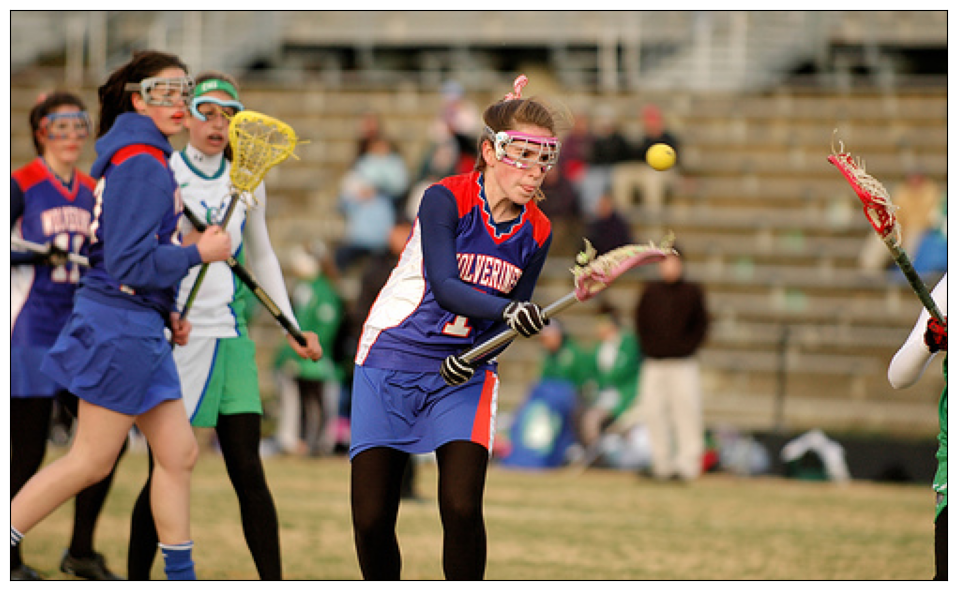


 a man   see from the back   with his head turn to the side wear a backpack 

Метрика RMSE: 0.41286844


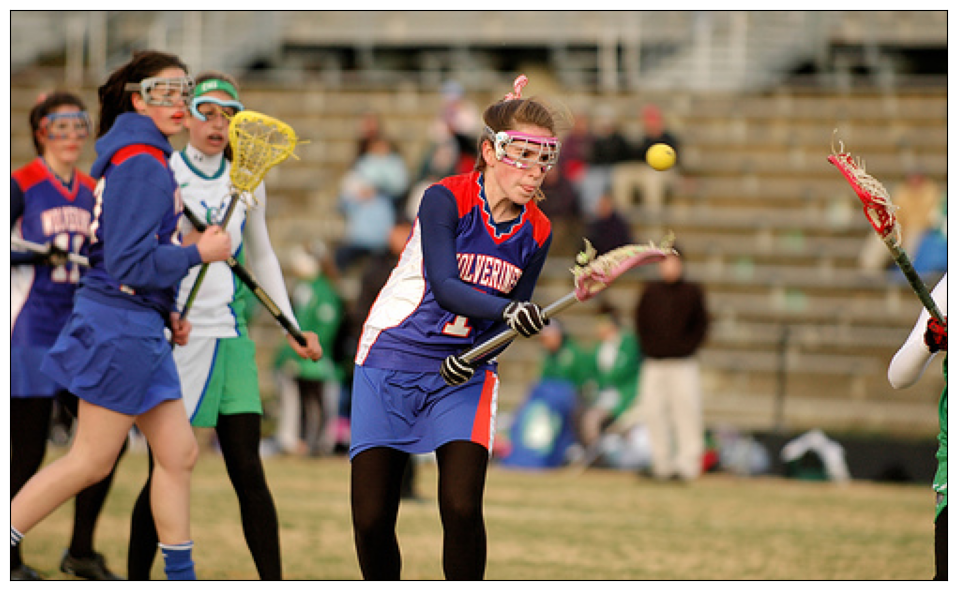


 a man wear glass and black clothing be sit while a man in a vest drink in the background 

Метрика RMSE: 0.363907


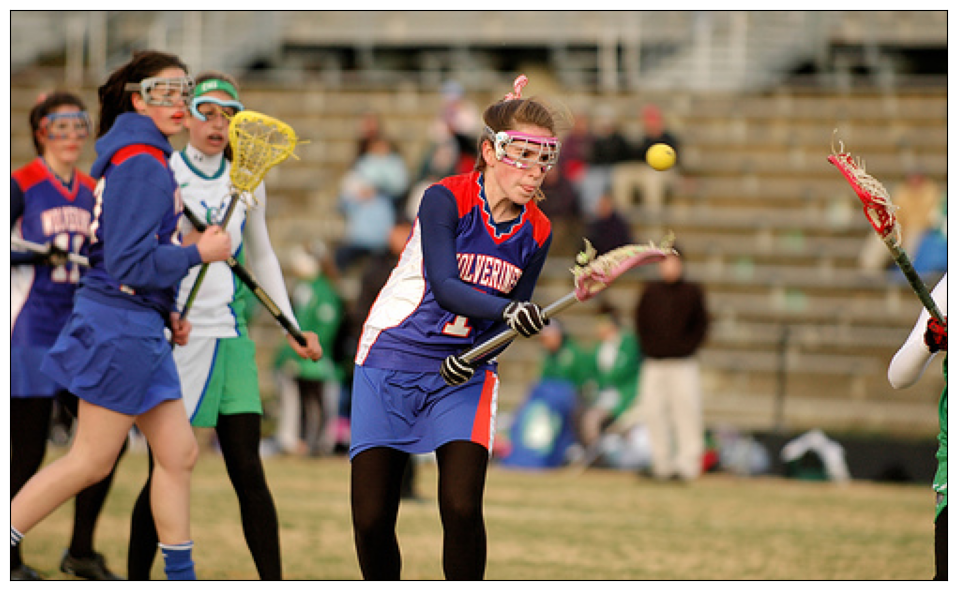

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.

 a red speed boat cross the water 

Метрика RMSE: 0.4215007


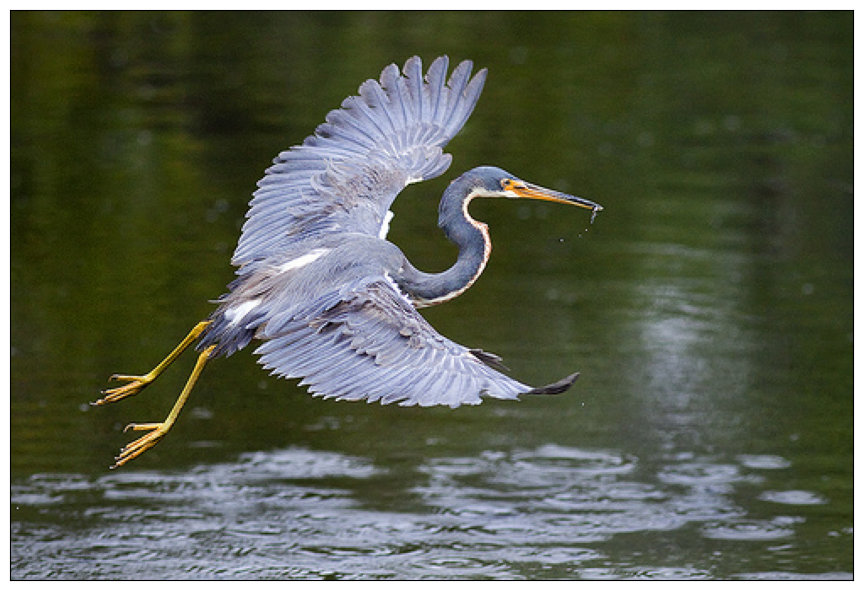


 a person jump off a dock into water 

Метрика RMSE: 0.53360814


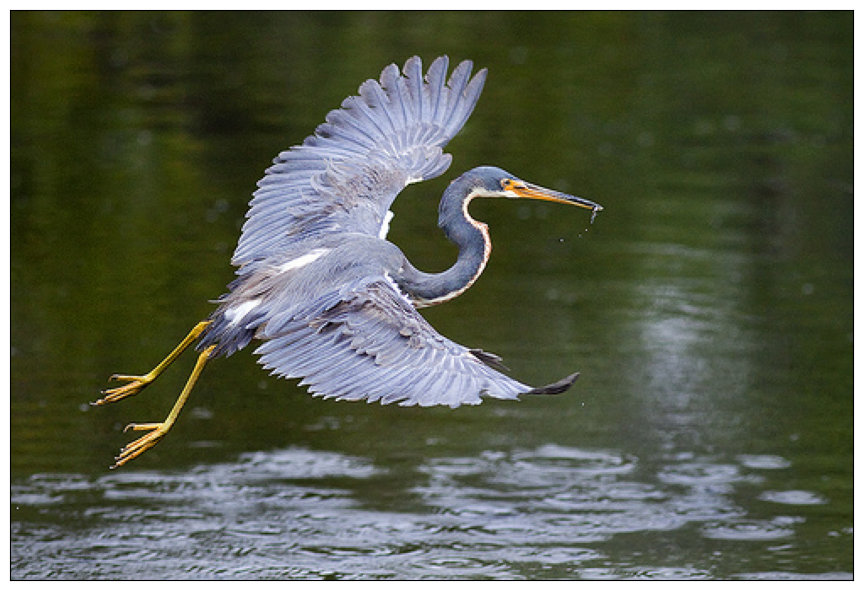


 a tennis player wear a blue shirt raise his hand and smile 

Метрика RMSE: 0.4573891


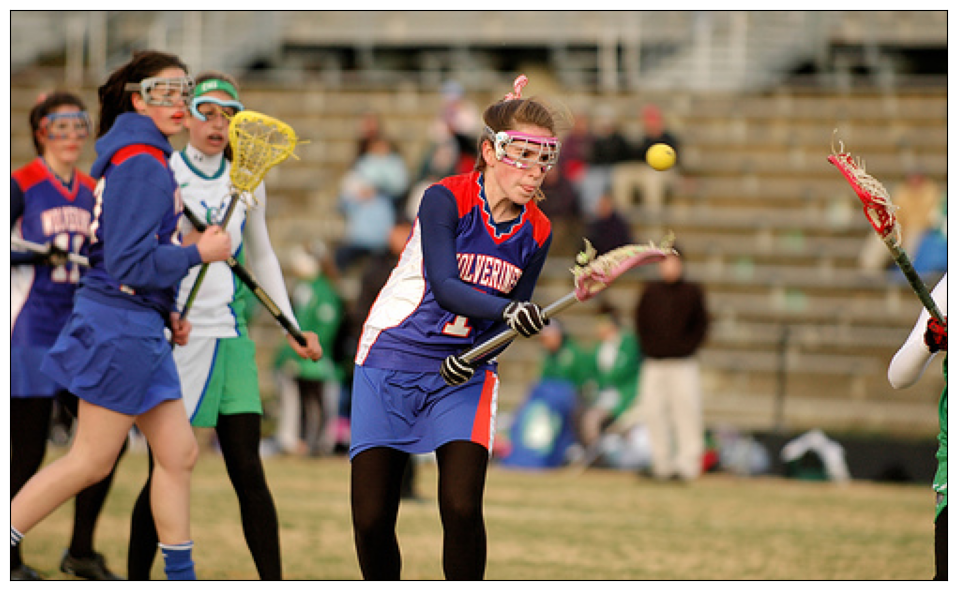

In [72]:
# проверяем работу модели
for text in list(test_queries['lemm_text'].sample(10)):
    result_image(text)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Функции написаны и со своей задачей справляются. Принимают на вход текст и находят изображение. Отрабатывают контроль "запрещенного контента".

В целом качество поиска не идеально, но определенные взаимосвязи между запросами и найдеными изображениями можно найти.
    
Как правило, хорошо видно "зачатки разумности" у модели, если она отличает людей от собак.
    
----------------
    
Как правило хороший результат в этом проекте удается достичь при выполнении следующих условий
    
 - использование экспертных оценок   
 - векторизация изображений через pytorch, как есть в теории к спринту  (но с отрезанием только одного слоя)
 - эмбеддинги через bert (лучший результат дает модель  `all-MiniLM-L6-v2`)
 - упорное обучение нейронки (иногда тысячи эпох, в любом случае пока лосс снижается) с тщательным подбором гиперпараметров.   
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Поменяла модель BERT. И поменяла коэффиценты на 0.8 и 0.2 при аграгации. Вроде чуть лучше предсказывает.

</div>

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Идеи и альтернативные подходы</b>
  Если хочешь получить хорошо работающее решение без обучения, то можешь провести эксперимент с нейронной сетью CLIP от OPEN AI (это не обязательно, только если хочешь добиться хороших результатов в этом проекте).

  Про эту нейронку много где написано, но можешь посмотреть например вот здесь  https://habr.com/ru/post/539312/.

  А для написания  реализации наиболее удобной лично для меня оказалась библиотека sbert. https://www.sbert.net/examples/applications/image-search/README.html  
    
    
<hr>    
    
Также неплохо работает следующий подход без предобученных моделей (к тому же легко реализуемый).
    
    
Вместо того, чтобы подавать на вход модели изображение + текст и получать меру соответствия, поступаем по другому. 
    
На вход модели подаем вектор описания, а на выходе учимся предсказывать вектор изображения. 
    
По поводу метрик тут ситуация следующая. Точно работает следующий подход
    
  - берем метрику mse, но тогда нужно чтобы модель её уменьшала. А значит в обучении используем только пары заведомо сответствующие друг другу

Можно попробовать использовать косинусное расстояние, она позволяет использовать все данные (если есть соответствие то выдает 1, если нет то 0). 
    
Также можно попробовать усложнить модель, например и изображения и тексты отправлять в пространство размерностью 256 и уже в этом пространстве учиться их "сближать".
    
По поводу методов векторизации: я бы использовать resnet18 для изображений (размерность эмбеддинга избражения 512) и БЕРТ для текстов (768). 
    
   
</div>

## 8. Выводы

В исследовании для фотохостинга для профессиональных фотографов «Со Смыслом» (“With Sense”) необходимо было разработать модель, которая будет искать референсные фотографии для фотографов, то есть подбирать фотографии под описание.

Данные были загружены корректно. Пропуски и дубликаты в данных отсутствуют. Проведен исследовательский анализ данных: наиболее часто встречаются слова *dog*, *two* и *man*. Следует отметить, что в описаниях встречаются слова *boy*, *girl* и *young*, а в фотографиях встречаются фото детей, что может накладывать законодательные ограничения в использовании таких данных в ряде стран. Также на основе краудсорсинговых и экспертных оценок была получена агрегированая оценка соответствия изображения тексту. Такие изображения были исключены из датасета для обучения. Далее была проведена векторизация изображений с помощью ResNet50 и векторизация текстовых описаний с помощью предобученной нейронной сети Bert. На основе суммарного вектора были обучены несколько моделей МО. В качестве метрики использовали метрику *RSME*, так как она чувствительна к выбросам и достаточно легко интерпретируема. Лучше всего себя показала нейронная сеть. Однако, модель LGBM показала практически такой же результат. Лучшую модель протестировали не тестовой выборке, и вывели изображение максимально подходящее под описание.

**Итоговый вывод:** при достаточно высоком качестве работы модели, не релевантные результаты попадаются. Устранить данный недостаток может дальнейшее улучшение модели, а также борьба с переобучением или расширение обучающей выборки.

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Заключительный комментарий</b>

Подведем итоги. Я вижу, что в целом с проектом ты справляешься.
    
Проведено исследование и предобработка данных. Выполнена векторизация изображений и текстовых описаний. Обучены модели для предсказания степени соответствия, а также написана функция для инференса и с её помощью проведено тестирование.
 
У меня нет критичных замечаний (единственный красный комментарий является красным для привлечения внимания).  Проект может быть принят уже сейчас. Возвращаю проект чтобы дать тебе возможность ознакомиться с моими комментариями, возможно у тебя возникнет желание задать вопросы или внести корректировки в проект.
    
Желтые комментарии на твое усмотрение. Но учитывая что наш подход "не взлетел" и нужно хоть что-то показать заказчику, попробуй показать возможный инференс с помщью CLIP. С библиотекой sentence-transformers это делается буквально в 10 строк.    
Жду твою работу на повторное ревью.
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Добавила поиск изображения по тексту с помощью нейронной сеть CLIP и библиотеки sentence_transformers. С ней решение и правда получается совсем короткое и работает лучше)

</div>

## 9. Библиотека CLIP

Так как в результате получили не очень хорошие предсказания, рассмотрим решение с помощью нейронной сеть CLIP и библиотеки sentence_transformers. SentenceTransformers позволяют встраивать изображения и текст в одно и то же векторное пространство.

In [73]:
!pip install sentence_transformers -q

In [74]:
from sentence_transformers import SentenceTransformer, util

In [75]:
# загружаем модель
model_clip = SentenceTransformer('clip-ViT-B-32')

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [76]:
# пути к файлам
path_image = [path +'/test_images/'+ i for i in test_images['image']]  
# формируем эмбеддинги изображений
emb_imgage = model_clip.encode([Image.open(i) for i in path_image])

In [77]:
def result_image_clip(text):
    '''Функция сопоставления изображений с запросом'''
    # проверка попадает ли запрос под законодательстно
    text_list = text.split()
    intersection = set(text_list).intersection(BLOCK_WORDS)
    if intersection:
        print('This image is unavailable in your country in compliance with local laws.')
    else:
        emb_query = model_clip.encode([text])
        hits = util.semantic_search(emb_query, emb_imgage)[0]
        top_score = round(hits[0]['score'], 4)
        print('\n', text, '\n')
        print(f'Метрика RMSE:', top_score)
        # выведем наиболее похожее изображение
        plt.subplots(figsize=(10, 6))
        image = Image.open(path_image[hits[0]['corpus_id']])
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.show()


 a man with a white hat and plaid shirt behind a woman with a red headdress  

Метрика RMSE: 0.3116


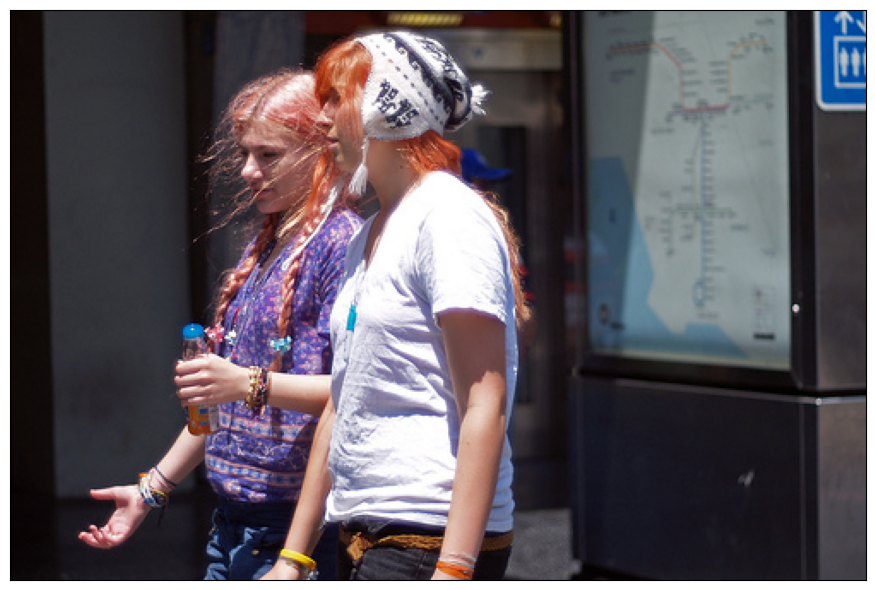


 man rides on bicycle as other people walk  

Метрика RMSE: 0.2677


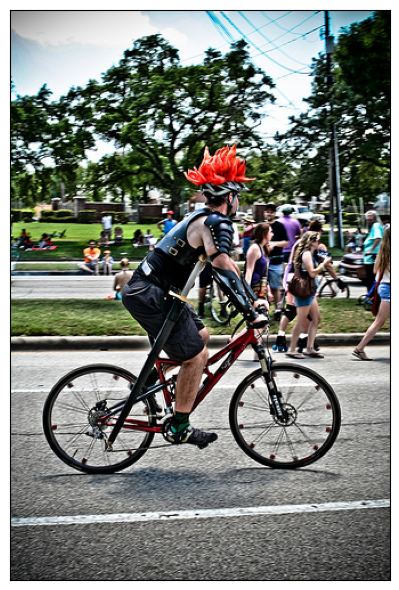


 many people walk through the store  

Метрика RMSE: 0.2817


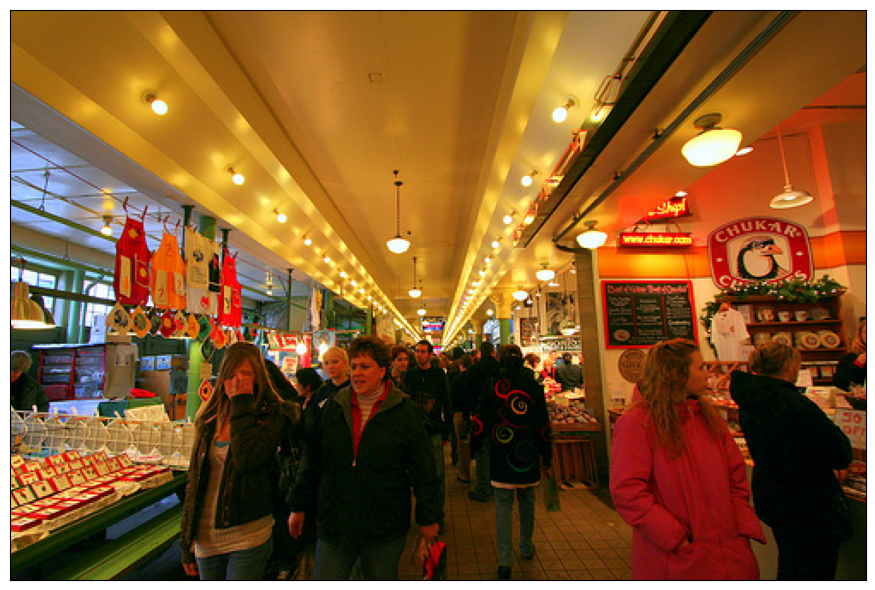


 a black and white dog biting onto a chunk of ice  

Метрика RMSE: 0.2965


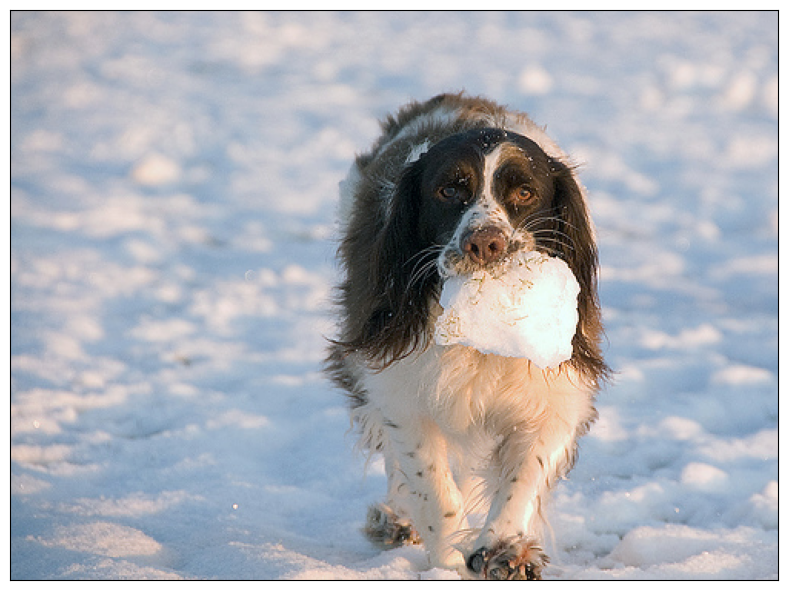


 a black man in a blue shirt stands next to a black man in a red robe  

Метрика RMSE: 0.313


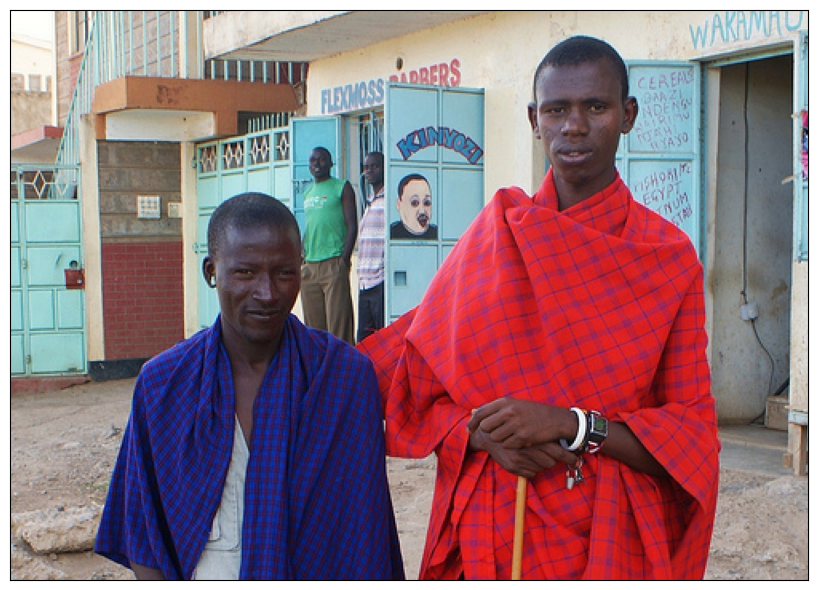


 six men have a band practice in the woods  

Метрика RMSE: 0.3203


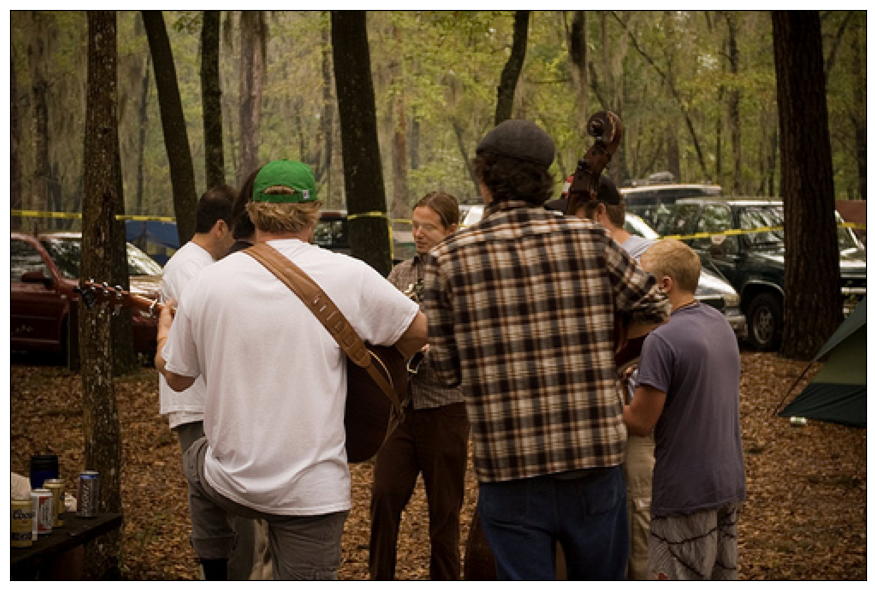


 a man and a woman dress up  

Метрика RMSE: 0.2565


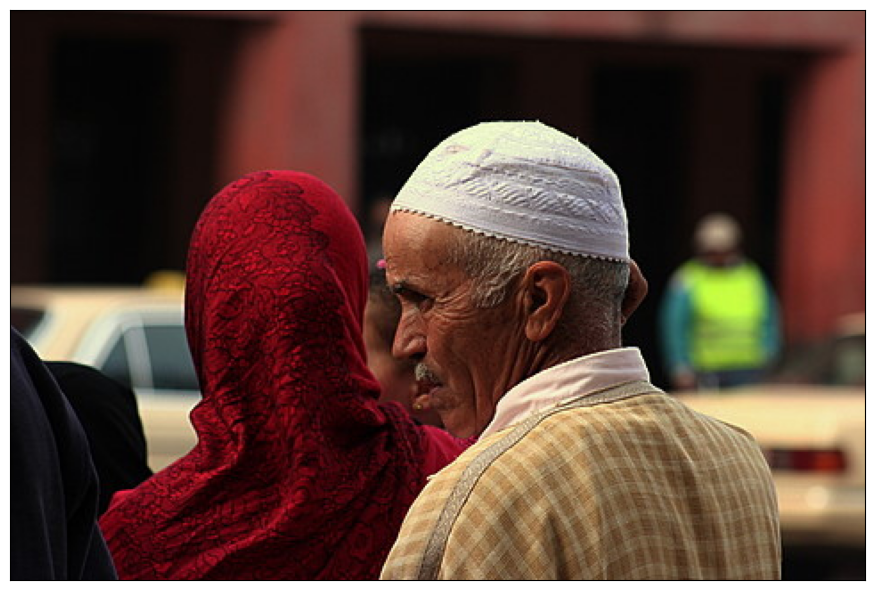

This image is unavailable in your country in compliance with local laws.
This image is unavailable in your country in compliance with local laws.

 a tan dog is pulling a red sled in the snow  

Метрика RMSE: 0.3315


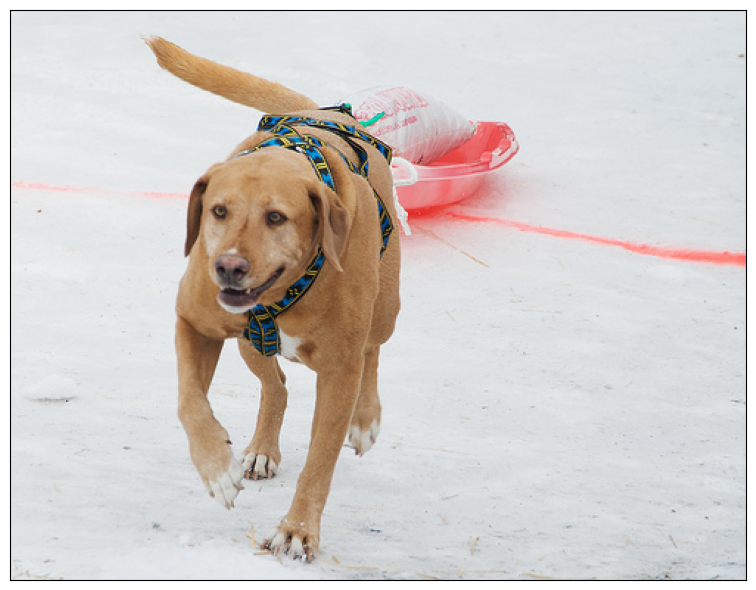

In [78]:
# проверяем работу модели
for text in list(test_queries['clean_query_text'].sample(10)):
    result_image_clip(text)